# 1. Import libraries and load the data

In [458]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

import haversine as hs
import folium
import branca.colormap as cm
from branca.element import Figure

import warnings
warnings.simplefilter("ignore")
pd.set_option('display.max_rows', 100)

In [450]:
df_calendar = pd.read_csv("data/boston_airbnb/calendar.csv")
df_listings = pd.read_csv("data/boston_airbnb/listings.csv")

In [451]:
df_calendar["city_assignment"] = "Boston"
df_listings["city_assignment"] = "Boston"

Short Description of the data 

* Listings: full descriptions and average review score of the Airbnb appartment
* Calendar: listing id + price / availability for that day

# 2. First Look in the data

### Check the first rows of the data

In [422]:
df_calendar.head()

,listing_id,date,available,price,city_assignment
0,12147973,2017-09-05,f,NaN,Boston
1,12147973,2017-09-04,f,NaN,Boston
2,12147973,2017-09-03,f,NaN,Boston
3,12147973,2017-09-02,f,NaN,Boston
4,12147973,2017-09-01,f,NaN,Boston


In [423]:
df_listings.head(3).T

,0,1,2
id,12147973,3075044,6976
listing_url,https://www.airbnb.com/rooms/12147973,https://www.airbnb.com/rooms/3075044,https://www.airbnb.com/rooms/6976
scrape_id,20160906204935,20160906204935,20160906204935
last_scraped,2016-09-07,2016-09-07,2016-09-07
name,Sunny Bungalow in the City,Charming room in pet friendly apt,Mexican Folk Art Haven in Boston
...,...,...,...
require_guest_profile_picture,f,f,t
require_guest_phone_verification,f,f,f
calculated_host_listings_count,1,1,1
reviews_per_month,NaN,1.3,0.47


This short look into the data gives a certain insight, how the data is structured in its dataframes and strengths from the first moment the grip to the data

### Size, unique statistical units, timeframe

In [454]:
#size
for df_name, df in zip(["df_calendar", "df_listings"], [df_calendar, df_listings]):
    print(f"The shape of {df_name} for Boston: {df[df["city_assignment"]=='Boston'].shape}")

The shape of df_calendar for Boston: (1308890, 5)
The shape of df_listings for Boston: (3585, 96)


In [426]:
unique_flats_boston = len(df_calendar[df_calendar["city_assignment"] == "Boston"]["listing_id"].unique())

print(f"Count of appartments in Boston: {unique_flats_boston}")

Count of appartments in Boston: 3585


In [428]:
print(f"Boston data ranges from {df_calendar[df_calendar['city_assignment'] == 'Boston']['date'].min()} to {df_calendar[df_calendar['city_assignment'] == 'Boston']['date'].max()}")

Boston data ranges from 2016-09-06 to 2017-09-05


### Null values

#### df_calendar

In [464]:
df_calendar.isnull().sum()

listing_id              0
date                    0
available               0
price              665853
city_assignment         0
dtype: int64

In [466]:
df_calendar["price"].isnull().value_counts(normalize = True)

price
True     0.508716
False    0.491284
Name: proportion, dtype: float64

In [462]:
df_calendar[df_calendar.isnull().any(axis = 1)]["available"].value_counts()

available
f    665853
Name: count, dtype: int64

The calendar dataframe contains around 50 % of nan-values. The nan-values appear always when the appartment is not available (available == f).

#### df_listings

In [473]:
null_vals_listings = pd.DataFrame(df_listings.isnull().sum().sort_values(ascending = False)).rename({0: "null_values_abs"}, axis = 1)
null_vals_listings["%"] = np.round(null_vals_listings["null_values_abs"] / df_listings.shape[0],2)

In [474]:
null_vals_listings

,null_values_abs,%
has_availability,3585,1.00
license,3585,1.00
jurisdiction_names,3585,1.00
neighbourhood_group_cleansed,3585,1.00
square_feet,3529,0.98
monthly_price,2697,0.75
weekly_price,2693,0.75
security_deposit,2243,0.63
notes,1975,0.55
interaction,1554,0.43


There are several attributes in df_listings which show high values of null values.<br>
For example, the columns "has_availability", "licence", "jurisdiction_names", "neighbourhood_group_cleansed" or "square_feet" are missing to a high degree (98 % - 100 %) and contain no information for further analysis.<br>
The other columns with higher proportions of missing values should be investigated within the further analysis


### Check one appartment

For deeper understandment of the data, it is helpful to look into one record to grasph the idea of the columns.

In [446]:
df_one_airbnb = df_listings[df_listings["id"] == 12147973]

for col in df_one_airbnb.columns:
    print(f"{col}: {df_one_airbnb[col].values[0]}")

id: 12147973
listing_url: https://www.airbnb.com/rooms/12147973
scrape_id: 20160906204935
last_scraped: 2016-09-07
name: Sunny Bungalow in the City
summary: Cozy, sunny, family home.  Master bedroom high ceilings. Deck, garden with hens, beehives & play structure.   Short walk to charming village with  attractive stores, groceries & local restaurants. Friendly neighborhood. Access public transportation.
space: The house has an open and cozy feel at the same time.  The living room has a flat screen TV.  The kitchen has all you need for cooking.  We prefer you buy your food but can use the organic oils, herbs, etc.   The yard can be seen from sitting room and when the weather allows, the yard is a place children can lose themselves in a safe way.  We have 2 bee hives, 6 hens fenced in (sometimes they get out of their coop area & into the yard), 2 rabbits in a hutch and play structure.
description: Cozy, sunny, family home.  Master bedroom high ceilings. Deck, garden with hens, beehives &

### Check the datatypes

#### df_calendar

In [452]:
df_calendar.dtypes

listing_id          int64
date               object
available          object
price              object
city_assignment    object
dtype: object

* date column should be transformed to date / datetime
* price should be transformed in float

#### df_listings

In [448]:
df_listings.dtypes.value_counts()

object     63
float64    18
int64      15
Name: count, dtype: int64

In [480]:
df_listings.columns[df_listings.dtypes == "object"]

Index(['listing_url', 'last_scraped', 'name', 'summary', 'space',
       'description', 'experiences_offered', 'neighborhood_overview', 'notes',
       'transit', 'access', 'interaction', 'house_rules', 'thumbnail_url',
       'medium_url', 'picture_url', 'xl_picture_url', 'host_url', 'host_name',
       'host_since', 'host_location', 'host_about', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood',
       'host_verifications', 'host_has_profile_pic', 'host_identity_verified',
       'street', 'neighbourhood', 'neighbourhood_cleansed', 'city', 'state',
       'zipcode', 'market', 'smart_location', 'country_code', 'country',
       'is_location_exact', 'property_type', 'room_type', 'bed_type',
       'amenities', 'price', 'weekly_price', 'monthly_price',
       'security_deposit', 'cleaning_fee', 'extra_people', 'calendar_updated',
       'calendar_last_scraped', 'first_rev

In [484]:
df_listings[df_listings.columns[df_listings.dtypes == "object"]].head(1).T

,0
listing_url,https://www.airbnb.com/rooms/12147973
last_scraped,2016-09-07
name,Sunny Bungalow in the City
summary,"Cozy, sunny, family home. Master bedroom high..."
space,The house has an open and cozy feel at the sam...
description,"Cozy, sunny, family home. Master bedroom high..."
experiences_offered,none
neighborhood_overview,"Roslindale is quiet, convenient and friendly. ..."
notes,NaN
transit,"The bus stop is 2 blocks away, and frequent. B..."


In [481]:
df_listings.columns[df_listings.dtypes == "float64"]

Index(['neighbourhood_group_cleansed', 'latitude', 'longitude', 'bathrooms',
       'bedrooms', 'beds', 'square_feet', 'has_availability',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'license', 'jurisdiction_names',
       'reviews_per_month'],
      dtype='object')

In [482]:
df_listings.columns[df_listings.dtypes == "int64"]

Index(['id', 'scrape_id', 'host_id', 'host_listings_count',
       'host_total_listings_count', 'accommodates', 'guests_included',
       'minimum_nights', 'maximum_nights', 'availability_30',
       'availability_60', 'availability_90', 'availability_365',
       'number_of_reviews', 'calculated_host_listings_count'],
      dtype='object')

There are some of the attributes classified as "object" which are in reality numerical or date. In the following, the necessary variables will be transformed

### Check nunique values

#### df_calendar

In [488]:
df_calendar.nunique()

listing_id         3585
date                365
available             2
price              1246
city_assignment       1
dtype: int64

#### df_listings

In [491]:
df_listings.nunique().sort_values(ascending = True)

neighbourhood_group_cleansed           0
jurisdiction_names                     0
license                                0
has_availability                       0
country_code                           1
last_scraped                           1
experiences_offered                    1
scrape_id                              1
calendar_last_scraped                  1
state                                  1
city_assignment                        1
requires_license                       1
country                                1
is_location_exact                      2
host_identity_verified                 2
host_is_superhost                      2
instant_bookable                       2
require_guest_profile_picture          2
host_has_profile_pic                   2
require_guest_phone_verification       2
room_type                              3
host_response_time                     4
cancellation_policy                    4
market                                 4
bed_type        

The attributes with nunique vals = 1 are not informative for a model and can be dropped in the following

# 3. First Preprocessing

#### drop attributes without any information

In [506]:
null_attributes = null_vals_listings.loc[null_vals_listings["%"] == 1].index.tolist()
nunique_attributes = df_listings.nunique().sort_values(ascending = True).loc[df_listings.nunique().sort_values(ascending = True)<=1].index.tolist()

df_listings_droppped = df_listings.drop(null_attributes + nunique_attributes, axis = 1)

#### Add the attribute "distance to city center"

In [683]:
city_center_boston_lat = 42.361145
city_center_boston_lon = -71.057083
boston_loc = (city_center_boston_lat, city_center_boston_lon)

df_listings["distance_to_city_center"] = df_listings.apply(lambda x: hs.haversine(boston_loc, (x["latitude"], x["longitude"])) if x["city_assignment"]=="Boston" else  hs.haversine(seattle_loc, (x["latitude"], x["longitude"])), axis = 1)

# 4. Analysis

Question Beschreibung
########
########
########
########
########

In [684]:
amenities_dict = {}

for id in df_listings["id"]: 

    amenities = df_listings[df_listings["id"] == id]["amenities"].replace(r"[{}\"]", "", regex = True).str.split(",").iloc[0]
    amenities_dict[id] = amenities

In [685]:
list_amenities = sorted(list(set(",".join([",".join(l) for l in list(amenities_dict.values())]).split(","))))[1:]
df_amenities = pd.DataFrame({"Amenities": list_amenities})

In [686]:
for listing_id in list(amenities_dict.keys()):

    df_amenities[listing_id] = [1 if amenit in amenities_dict[listing_id] else 0 for amenit in df_amenities["Amenities"]]

In [689]:
df_amenities = df_amenities.set_index("Amenities").T

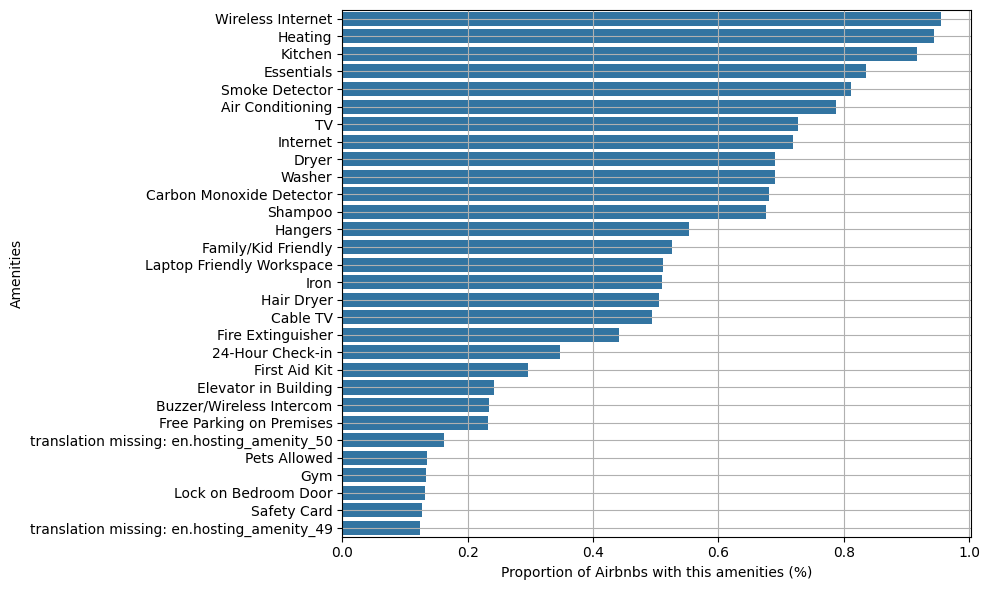

In [724]:
fig,sub = plt.subplots(1,1,figsize=(10,6))

top_thirty_amenities = df_amenities.mean(axis=0).sort_values(ascending = False).head(30)

sns.barplot(
    y = top_thirty_amenities.index,
    x = top_thirty_amenities,
    ax = sub,
    orient = "h"
)

sub.grid()
sub.set_xlabel("Proportion of Airbnbs with this amenities (%)")

fig.tight_layout()

In [516]:
potential_feats = ["weekday", "host_is_superhost", "host_reponse_rate", "host_response_time", 
"distance_to_city_center", "property_type", "accomodates", "bathrooms", "bedrooms", "beds", "security_deposit", "review_scores_rating"]

In [515]:
df_listings[]

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,city_assignment,distance_to_city_center
0,12147973,https://www.airbnb.com/rooms/12147973,20160906204935,2016-09-07,Sunny Bungalow in the City,"Cozy, sunny, family home. Master bedroom high...",The house has an open and cozy feel at the sam...,"Cozy, sunny, family home. Master bedroom high...",none,"Roslindale is quiet, convenient and friendly. ...",NaN,"The bus stop is 2 blocks away, and frequent. B...","You will have access to 2 bedrooms, a living r...",NaN,Clean up and treat the home the way you'd like...,https://a2.muscache.com/im/pictures/c0842db1-e...,https://a2.muscache.com/im/pictures/c0842db1-e...,https://a2.muscache.com/im/pictures/c0842db1-e...,https://a2.muscache.com/im/pictures/c0842db1-e...,31303940,https://www.airbnb.com/users/show/31303940,Virginia,2015-04-15,"Boston, Massachusetts, United States",We are country and city connecting in our deck...,NaN,NaN,NaN,f,https://a2.muscache.com/im/pictures/5936fef0-b...,https://a2.muscache.com/im/pictures/5936fef0-b...,Roslindale,1,1,"['email', 'phone', 'facebook', 'reviews']",t,f,"Birch Street, Boston, MA 02131, United States",Roslindale,Roslindale,NaN,Boston,MA,02131,Boston,"Boston, MA",US,United States,42.282619,-71.133068,t,House,Entire home/apt,4,1.5,2.0,3.0,Real Bed,"{TV,""Wireless Internet"",Kitchen,""Free Parking ...",NaN,$250.00,NaN,NaN,NaN,$35.00,1,$0.00,2,1125,2 weeks ago,NaN,0,0,0,0,2016-09-06,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,NaN,NaN,f,moderate,f,f,1,NaN,Boston,10.736344
1,3075044,https://www.airbnb.com/rooms/3075044,20160906204935,2016-09-07,Charming room in pet friendly apt,Charming and quiet room in a second floor 1910...,Small but cozy and quite room with a full size...,Charming and quiet room in a second floor 1910...,none,"The room is in Roslindale, a diverse and prima...","If you don't have a US cell phone, you can tex...",Plenty of safe street parking. Bus stops a few...,Apt has one more bedroom (which I use) and lar...,"If I am at home, I am likely working in my hom...",Pet friendly but please confirm with me if the...,https://a1.muscache.com/im/pictures/39327812/d...,https://a1.muscache.com/im/pictures/39327812/d...,https://a1.muscache.com/im/pictures/39327812/d...,https://a1.muscache.com/im/pictures/39327812/d...,2572247,https://www.airbnb.com/users/show/2572247,Andrea,2012-06-07,"Boston, Massachusetts, United States",I live in Boston and I like to travel and have...,within an hour,100%,100%,f,https://a2.muscache.com/im/users/2572247/profi...,https://a2.muscache.com/im/users/2572247/profi...,Roslindale,1,1,"['email', 'phone', 'facebook', 'linkedin', 'a

# 3. Establish Questions

1) Is the price in general higher in the city center?
2) Is the distance to the city center a determining factor for the prices? 
3) Is there a time within a year, where the prices are higher / lower? 
4) Are the prices of appartments which are not highly booked lower?

In [487]:
potential_feats = ["weekday", "host_is_superhost", "host_reponse_rate", "host_response_time", 
"distance_to_city_center", "property_type", "accomodates", "bathrooms", "bedrooms", "beds", "square_feet", "security_deposit", "review_scores_rating"]

# 4. Preprocessing

## A. Clean the data

In [302]:
df_calendar["price"] = df_calendar["price"].str.replace("[,$]", "", regex=True).copy()
df_calendar["price"] = df_calendar["price"].astype("float")
df_calendar.rename({"price": "price_in_dollar"}, axis = 1, inplace = True)

df_listings["price"] = df_listings["price"].str.replace("[,$]", "", regex=True).copy()
df_listings["price"] = df_listings["price"].astype("float")
df_listings.rename({"price": "price_in_dollar"}, axis = 1, inplace = True)

df_calendar["date"] = pd.to_datetime(df_calendar["date"], format = "%Y-%m-%d")

## A. Handling Missing Data

### Check which data's is missing

In [303]:
df_boston_c = df_calendar[df_calendar["city_assignment"] == "Boston"]
df_seattle_c = df_calendar[df_calendar["city_assignment"] == "Seattle"]

In [304]:
#drop appartments which hasn't been rented in the observation time frame
def get_not_relevant_listings(df):

    not_available_ranking = df.groupby("listing_id")["available"].value_counts(normalize=True).reset_index().query("available == 'f'").sort_values(by = "proportion", ascending=False)
    not_relevant_listings = not_available_ranking[not_available_ranking["proportion"] == 1.0]["listing_id"].unique().tolist()

    return not_relevant_listings
######################

not_relevant_boston = get_not_relevant_listings(df_boston_c)
not_relevant_seattle = get_not_relevant_listings(df_seattle_c)

mask_boston = (df_calendar["city_assignment"] == "Boston")&(df_calendar["listing_id"].isin(not_relevant_boston))
mask_seattle= (df_calendar["city_assignment"] == "Seattle")&(df_calendar["listing_id"].isin(not_relevant_seattle))

df_calendar_dropped = df_calendar[(~mask_boston)&(~mask_seattle)]

In [305]:
#impute the price by forward and backward filling
df_calendar_dropped = df_calendar_dropped.sort_values(by = ["listing_id", "date"], ascending=True)
df_calendar_dropped.loc[:, "price_in_dollar_ff"] = df_calendar_dropped.groupby("listing_id")["price_in_dollar"].transform(lambda v: v.ffill().bfill())

In [306]:
df_calendar_dropped

,listing_id,date,available,price_in_dollar,city_assignment,price_in_dollar_ff
797160,3335,2016-01-04,f,NaN,Seattle,120.0
797161,3335,2016-01-05,f,NaN,Seattle,120.0
797162,3335,2016-01-06,f,NaN,Seattle,120.0
797163,3335,2016-01-07,f,NaN,Seattle,120.0
797164,3335,2016-01-08,f,NaN,Seattle,120.0
...,...,...,...,...,...,...
388364,14933461,2017-09-01,t,165.0,Boston,165.0
388363,14933461,2017-09-02,t,165.0,Boston,165.0
388362,14933461,2017-09-03,t,165.0,Boston,165.0
388361,14933461,2017-09-04,t,165.0,Boston,165.0


## B. Handle categorical data

# 5. Analysis

### A. Is the price in general higher in the city center?

#### Preparation of general data

In [307]:
city_center_seattle_lat = 47.60621 
city_center_seattle_lon = -122.33207
seattle_loc = (city_center_seattle_lat, city_center_seattle_lon)

city_center_boston_lat = 42.361145
city_center_boston_lon = -71.057083
boston_loc = (city_center_boston_lat, city_center_boston_lon)

In [308]:
#calc distances to city center
df_listings["distance_to_city_center"] = df_listings.apply(lambda x: hs.haversine(boston_loc, (x["latitude"], x["longitude"])) if x["city_assignment"]=="Boston" else  hs.haversine(seattle_loc, (x["latitude"], x["longitude"])), axis = 1)

In [309]:
def draw_map(df, loc_city_center):

    fig = Figure(width=1200, height=600)

    min_price = df["price_in_dollar"].astype("float").min()
    median_price = df["price_in_dollar"].astype("float").median()
    std_price = df["price_in_dollar"].astype("float").std()
    max_price = df["price_in_dollar"].astype("float").max()

    map = folium.Map(location=[loc_city_center[0], loc_city_center[1]], zoom_start=12, width=1200, height=600)
    fig.add_child(map)

    folium.TileLayer('cartodbpositron').add_to(map)

    colormap = cm.StepColormap(colors=['green','yellow', 'orange', 'red'] ,
                            #index=[min_price, 100, 250,1000], 
                            vmin= min_price,
                            vmax=median_price + 1.5 * std_price)

    for id in df["id"].unique():

        lat = df[df["id"] == id]["latitude"]
        lon = df[df["id"] == id]["longitude"]
        price = df[df["id"] == id]["price_in_dollar"].astype("float").values[0]
        name = df[df["id"] == id]["name"].values[0]

        folium.Circle(
            location = [lat, lon],
            radius=6,
            fill=True,
            popup=f"name: {name}\nprice: {price} Dollar",
            color=colormap(price)
            ).add_to(map)


    folium.Marker(
        location = [loc_city_center[0], loc_city_center[1]],
        popup = "City Center"
    ).add_to(map)

    display(fig)

In [310]:
df_listing_boston = df_listings[df_listings["city_assignment"] == "Boston"]
df_listing_seattle = df_listings[df_listings["city_assignment"] == "Seattle"]

#### Visual Check of Maps concerning Airbnb prices

Boston

In [311]:
draw_map(df_listing_boston, boston_loc)

Seattle

In [312]:
draw_map(df_listing_seattle, seattle_loc)

Observations -------------------------------

#### Correlation Analysis

In [313]:
feats = ["distance_to_city_center", "price_in_dollar"]

df_listing_seattle[feats].corr()

,distance_to_city_center,price_in_dollar
distance_to_city_center,1.000000,-0.140038
price_in_dollar,-0.140038,1.000000


In [314]:
feats = ["distance_to_city_center", "price_in_dollar"]

df_listing_boston[feats].corr()

,distance_to_city_center,price_in_dollar
distance_to_city_center,1.000000,-0.296221
price_in_dollar,-0.296221,1.000000


In [315]:
feats = ["distance_to_city_center", "price_in_dollar"]

df_listings[feats].corr()

,distance_to_city_center,price_in_dollar
distance_to_city_center,1.000000,-0.239081
price_in_dollar,-0.239081,1.000000


-------------------Observations

### B. Is there a concrete period in the year, where prices variate with time?

In [333]:
df_calendar_boston = df_calendar_dropped[df_calendar_dropped["city_assignment"] == "Boston"]
df_calendar_seattle = df_calendar_dropped[df_calendar_dropped["city_assignment"] == "Seattle"]

In [403]:
df_calendar_boston_mean = df_calendar_boston.groupby("date")["price_in_dollar"].mean()
df_calendar_seattle_mean = df_calendar_seattle.groupby("date")["price_in_dollar"].mean()
df_calendar_mean = df_calendar_dropped.groupby("date")["price_in_dollar"].mean()

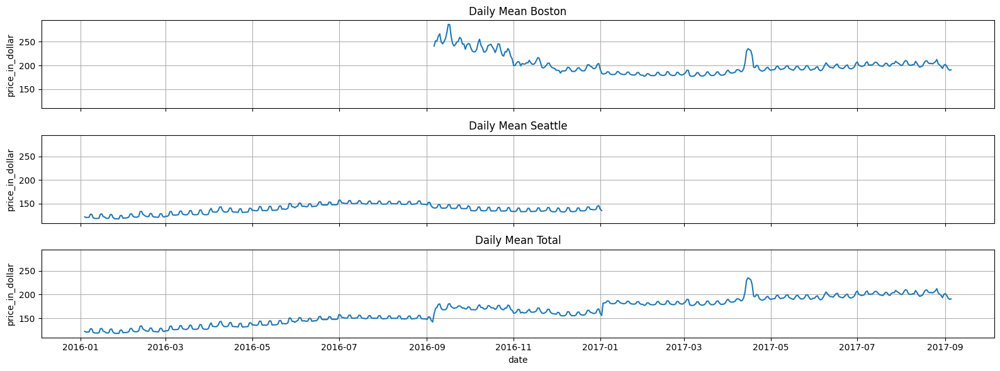

In [404]:
fig, sub = plt.subplots(3,1,figsize=(16,6), sharex=True, sharey=True)
sub = sub.flatten()

sns.lineplot(x = df_calendar_boston_mean.index, y = df_calendar_boston_mean, ax = sub[0])
sns.lineplot(x = df_calendar_seattle_mean.index, y = df_calendar_seattle_mean, ax = sub[1])
sns.lineplot(x = df_calendar_mean.index, y = df_calendar_mean, ax = sub[2])

ls = ["Daily Mean Boston",  "Daily Mean Seattle", "Daily Mean Total"]

for i,s in enumerate(sub.flatten()):
    s.grid()
    s.set_title(ls[i])

fig.tight_layout()

Text(0.5, 1.0, 'Seattle Airbnb Daily Mean Price over weekdays')

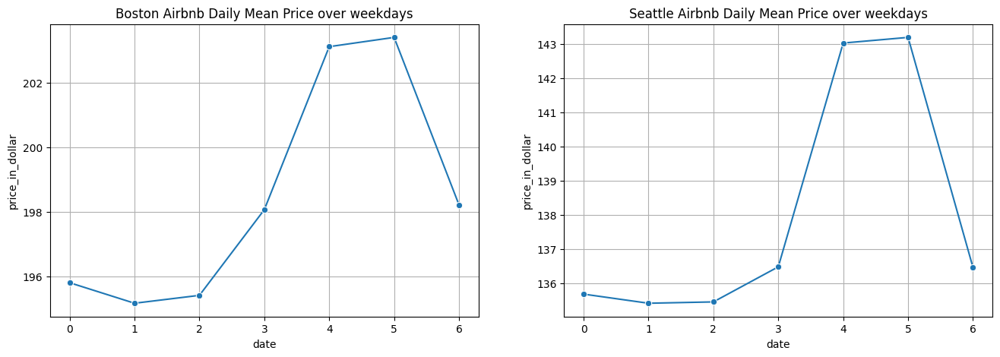

In [400]:
fig, sub = plt.subplots(1,2, figsize=(16,5))

boston_day_of_week = df_calendar_boston.groupby(df_calendar_boston["date"].dt.dayofweek)["price_in_dollar"].mean()
seattle_day_of_week = df_calendar_seattle.groupby(df_calendar_seattle["date"].dt.dayofweek)["price_in_dollar"].mean()

sns.lineplot(x = boston_day_of_week.index, y = boston_day_of_week, ax = sub[0], marker = "o")
sns.lineplot(x = seattle_day_of_week.index, y = seattle_day_of_week, ax = sub[1], marker = "o")

sub[0].grid()
sub[1].grid()

sub[0].set_title("Boston Airbnb Daily Mean Price over weekdays")
sub[1].set_title("Seattle Airbnb Daily Mean Price over weekdays")

### C. Is the distance to the city center a determining factor for the prices?

In [417]:
potential_feats = ["weekday", "host_is_superhost", "host_reponse_rate", "host_response_time", 
"zipcode", "distance_to_city_center", "property_type", "accomodates", "bathrooms", "bedrooms", "beds", "square_feet", "security_deposit", "review_scores_rating"]

In [406]:
df_calendar_dropped.head(3)

,listing_id,date,available,price_in_dollar,city_assignment,price_in_dollar_ff
797160,3335,2016-01-04,f,NaN,Seattle,120.0
797161,3335,2016-01-05,f,NaN,Seattle,120.0
797162,3335,2016-01-06,f,NaN,Seattle,120.0


In [411]:
df_calendar_dropped["weekday"] = df_calendar_dropped["date"].dt.weekday

In [ ]:
pd.merge(left = df_calendar_dropped, )

# 6. Conclusion